# BikeSaferPA: predicting outcomes for cyclists using Pennsylvania crash data, 2002-2021

## Part II: Data visualization and exploration

In the second phase of the project, I explore the datasets 'cyclists' and 'crashes' and visualized some trends.  Recall that I am particularly interested in the percentage of cyclists suffering serious injury or fatality among cyclists involved in crashes, and in particular I would like to examine how this percentage changes when I restrict to crashes in which certain factors are present.

Using the 'crashes' dataframe, I will:
* Examine prevalences of all crashes involving bicycles, and crashes resulting in serious cyclist injury or fatality, by year, month of the year, day of the week, and time of the day.
* Visualize the location data of crashes both statewide and locally in a selection of major urban areas.

Using the 'cyclists' dataframe, I will:
* Examine the distributions of various features among the following cohorts:
    * all cyclists involved in crashes
    * cyclists who suffered serious injury
    * cyclists who suffered fatality
* Identify crash factors which, when we condition on those factors being present, dramatically increase the percentage of cyclists being seriously injured or killed.
* Identify pairs of crash factors which have a significant compounding effect on chance of serious cyclist injury or death.

First, import the necessary libraries and load in the dataframes prepared in Part I.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import seaborn as sns

from IPython.display import display, display_html
from ipywidgets import widgets

import warnings
warnings.filterwarnings("ignore")

pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth',None)

plt.style.use('fivethirtyeight')

import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from plotly.offline import plot

from scipy import stats

import sys
import numpy
numpy.set_printoptions(threshold=sys.maxsize)

In [2]:
cyclists = pd.read_csv('cyclists.csv')
crashes = pd.read_csv('crashes.csv')

### Navigation:

* [Crash occurences over time](#time)
    * [Annual crash occurences, 2002-2021](#time_annual)
    * [Crash occurences by month of the year](#time_month)
    * [Monthly crash occurences, 2002-2021](#time_monthly)
    * [Crash occurences by day of the week](#time_day)
    * [Crash occurences by hour of the day](#time_hour)
* [Visualizing crashes on a map](#map)
    * [Statewide crashe map](#map_state)
    * [Philadelphia crash map](#map_phila)
* [Prevalence of various feature values](#features)
    * [Visualizing feature prevalence](#features_vis)
    * [Summary of feature value comparison](#features_summary)
* [Visualizing pairs of features](#pairs)
* [Summarization of findings](#summary)


<a id="time"></a>
### Occurences of crashes involving bicycles over time

The following helper function will create three subplots according to desired input time period:
* The counts of crashes involving bicycles by year/month/day/hour
* The counts of crashes resulting in serious injury to cyclist by year/month/day/hour
* The counts of crashes resulting in cyclist death by year/month/day/hour

In [3]:
# Create string feature DATE of the form 'MM-YYYY'
crashes['DATE'] = (crashes['CRASH_MONTH'].astype('str')+'-'+crashes['CRASH_YEAR'].astype('str')).astype('datetime64')
crashes=crashes.sort_values(by='DATE')
crashes['DATE']=crashes['DATE'].astype('str').apply(lambda x: x.rsplit('-',1)[0])

def plot_over_time(df = crashes, feature='CRASH_YEAR',label='year',kde=False,bw_adjust=[1,1,1],split_urban_rural = False,best_legend=False):
    """
    Displays figure containing three subplots, all
    barplots of counts of the following over time:
    1. All crashes involving bicycles from 2002-2021
    2. Those which resulted in some serious injury of cyclist(s)
    3. Those which resulted in fatality of cyclist(s)
    
    
    Parameters:
    -----------
    df : pd.DataFrame
        dataframe of crash data
    feature : str
        feature to use on the x-axis (time frequency)
        must be one of:
        'CRASH_YEAR', 'CRASH_MONTH','DAY_OF_WEEK','TIME_OF_DAY'
    label : str
        the desired label for that feature to use in plot titles
        recommended: 'year', 'month', 'day of the week', 'hour of the day'
    kde : bool
        if kind == 'hist' and kde is True, the plots will include
        a kernel density estimate curve
    bw_adjust : list
        list of three positive floats, each will serve as the bandwidth
        adjustment parameter for the corresponding plot's kde curve.
        larger values provide smoother kde curves
    split_urban_rural : bool
        if split_urban_rural==True, then rural counts and urban/urbanized
        counts will be separated into stacked barplot series
    best_legend : bool
        if best_legend==True, will set the legend position to 'best'.
        otherwise, will set it to 'lower center'
        
    Returns: None (figure displayed)
    -------
    """
    
    df = df.copy()
    plot_dict={}
    
    # Additional parameters for stacked urban/rural bars
    if split_urban_rural:
        df['URBAN_RURAL'] = df['URBAN_RURAL'].where(df.URBAN_RURAL=='rural','urban or urbanized')
        plot_dict['hue']='URBAN_RURAL'
        plot_dict['hue_order']=['rural','urban or urbanized']
        plot_dict['multiple']='stack'
    
    # Define cohorts
    df_inj = df[df.BICYCLE_SUSP_SERIOUS_INJ_COUNT>0]
    df_death = df[df.BICYCLE_DEATH_COUNT>0]
    df_inj_or_death = df[(df.BICYCLE_DEATH_COUNT>0)|(df.BICYCLE_SUSP_SERIOUS_INJ_COUNT>0)]
    
    # Set axis label parameter values based on feature
    if feature=='CRASH_YEAR':
        span = range(2002,2022)
        rot=45
        tick_labels=span
    elif feature=='CRASH_MONTH':
        span = range(1,13)
        rot=0
        tick_labels = ['Jan','Feb','Mar','Apr','May','Jun',
                       'Jul','Aug','Sep','Oct','Nov','Dec']
    elif feature=='DAY_OF_WEEK':
        span = range(1,8)
        rot=0
        tick_labels = ['Sun','Mon','Tues','Wed','Thurs','Fri','Sat']
    elif feature=='HOUR_OF_DAY':
        span = range(24)
        rot=45
        tick_labels = [str(x)+'a' for x in [12]+list(range(1,12))]\
                     +[str(x)+'p' for x in [12]+list(range(1,12))]
    else:
        raise ValueError("feature must be one of 'CRASH_YEAR','CRASH_MONTH','MONTH_OF_YEAR','TIME_OF_DAY'")

    # Initialize figure and plot on axes    
    fig,axs = plt.subplots(1,3,figsize=(20,5))
    fig.suptitle(f'Counts of crashes involving bicycles in PA by {label}, 2002-2021',fontsize='large')
    
    sns.histplot(ax=axs[0],data=df, x = feature,bins=span[1]-span[0]+1,
                 kde=kde,discrete=True,kde_kws={'bw_adjust':bw_adjust[0]},**plot_dict)
    sns.histplot(ax=axs[1],data = df_inj,x=feature,
                 bins=span[0]-span[0]+1,kde=kde,discrete=True,
                 kde_kws={'bw_adjust':bw_adjust[1]},**plot_dict)
    sns.histplot(ax=axs[2],data=df_death, x=feature,
                 bins=span[0]-span[0]+1,kde=kde,discrete=True,
                 kde_kws={'bw_adjust':bw_adjust[2]},**plot_dict)
    
    if best_legend:
        loc='best'
    else:
        loc='lower center'
    
    # Format axes
    for ax in axs:
        ax.set_xticks(span,labels=tick_labels)
            # ax.set_xticks(range(span[0],span[1]+1,(span[1]-span[0])//6))
        ax.set_title(f'Incidence of {feature} values',fontsize='small')
        ax.yaxis.set_tick_params(labelsize='small')
        ax.xaxis.set_tick_params(labelsize='x-small',labelrotation=rot)
        ax.set_ylabel(f'count of crashes per {label}',fontsize='small')
        ax.set_xlabel(label,fontsize='small')
        if split_urban_rural:
            legend = ax.get_legend()
            handles = legend.legendHandles
            legend.remove()
            ax.legend(handles, ['rural', 'urban or urbanized'], title='crash setting',loc=loc,ncol=2,
                     columnspacing=1,fontsize='small',title_fontsize='small')
    axs[0].set_title('All crashes' ,fontsize='medium')
    axs[1].set_title('Crashes with serious cyclist injury',fontsize='medium')
    axs[2].set_title('Crashes with cyclist fatality',fontsize='medium')
    plt.tight_layout()
    plt.show()

The following helper functions will create styled tables showing period-over-period percent changes of 

In [4]:
def compute_perc_change(df,period='year',title='all crashes'):
    """
    Computes period-over-period percent changes
    of the per-period count of samples
    
    Parameters:
    -----------
    df : pd.DataFrame
        dataframe of crash data
    period : str
        period to use - must be 'year' or 'month'
    title : str
        title for the column
        
    Returns:
    --------
    perc_change : pd.DataFrame
        dataframe showing period-over-period
        percent changes in sample count
        - one columns corresponding to the
          sample set included in df
        - rows correspond to time steps
    """
    # Calculate series of percent changes between timesteps
    if period == 'year':
        feat='CRASH_YEAR'
        first, last = df[feat].min(), df[feat].max()
        drop_time_steps=[first-1,first]
    elif period == 'month':
        feat='CRASH_MONTH'
        first, last = df[feat].min(), df[feat].max()
        drop_time_steps=first-1
    else:
        raise ValueError("period must be 'year' or 'month'")
    
    counts = df[feat].value_counts()
    counts.loc[first-1]=counts[last]
    counts=counts.sort_index()
    perc_change = np.round(100*(counts-counts.shift(1))/counts.shift(1),1).drop(drop_time_steps,axis=0)
    
    # Convert to dataframe
    perc_change = pd.DataFrame({title:perc_change})
    perc_change.index.name=period
    return perc_change

def perc_change_table(df=crashes,period='year'):
    """
    Display a styled dataframe of period-over-period
    percent changes in sample count among various
    crash sample sets
    
    Parameters:
    -----------
    df : pd.DataFrame
        dataframe of crash data
    period : str
        period to use - must be 'year' or 'month'
    
    Returns:
    --------
    None; displays a styled dataframe:
        - rows correspond to four subsets among crash samples:
            - all crashes involving bicycles
            - crashes with serious cyclist injury
            - crashes with cyclist fatality
            - crashes with either serious cyclist injury
              or cyclist fatality
        - columns correspond to time steps
        - each cell contains the percent change of the
          count of the corresponding subset from the
          previous time step to the current time step
        - the cell is shaded based on the percent change
            - blue for decrease, red for increase
            - intensity of color indicates 
              magnitude of percent change
    """
    # Define cohorts
    df_inj = df[df.BICYCLE_SUSP_SERIOUS_INJ_COUNT>0]
    df_death = df[df.BICYCLE_DEATH_COUNT>0]
    df_inj_or_death = df[(df.BICYCLE_DEATH_COUNT>0)|(df.BICYCLE_SUSP_SERIOUS_INJ_COUNT>0)]
    
    # Build dataframe by merging calls to compute_perc_change
    perc_change = compute_perc_change(df,period=period).merge(compute_perc_change(df_inj,period=period,
                                                                         title='with serious injury'),on=period)\
                                          .merge(compute_perc_change(df_death,period=period,
                                                                     title='with fatality'),on=period)\
                                         .merge(compute_perc_change(df_inj_or_death,period=period,
                                                                    title='with either'),on=period)\
                                         .rename_axis(f'{period}ly change of:',axis='columns').transpose()
    # Display stylized dataframe
    display((perc_change.astype('str')+'%').style.background_gradient(axis=None,cmap='bwr',gmap=perc_change,vmin=-100,vmax=100))

<a id="time_annual"></a>
#### Annual crash totals from 2002-2021

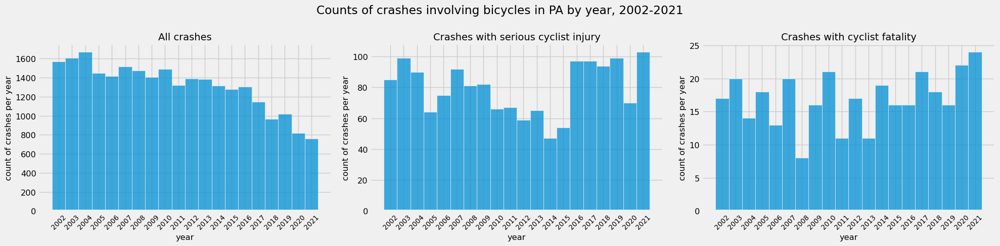

In [5]:
plot_over_time()

Below is a display of the year-over-year percents changes in each type of crash.  Decreases are shaded blue and increases are shaded red; the intensity of the hue reflects the magnitide of the percent change.

In [6]:
perc_change_table()

year,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
yearly change of:,,,,,,,,,,,,,,,,,,,
all crashes,2.3%,3.9%,-13.4%,-2.1%,7.2%,-3.0%,-4.7%,6.0%,-11.1%,5.1%,-0.4%,-5.1%,-3.0%,2.3%,-12.4%,-15.7%,5.7%,-19.6%,-7.3%
with serious injury,16.5%,-9.1%,-28.9%,17.2%,22.7%,-12.0%,1.2%,-19.5%,1.5%,-11.9%,10.2%,-27.7%,14.9%,79.6%,0.0%,-3.1%,5.3%,-29.3%,47.1%
with fatality,17.6%,-30.0%,28.6%,-27.8%,53.8%,-60.0%,100.0%,31.2%,-47.6%,54.5%,-35.3%,72.7%,-15.8%,0.0%,31.2%,-14.3%,-11.1%,37.5%,9.1%
with either,17.8%,-12.6%,-21.2%,7.3%,27.3%,-21.4%,10.2%,-10.3%,-10.3%,-2.6%,0.0%,-13.2%,6.1%,61.4%,4.4%,-5.1%,2.7%,-20.0%,37.0%


Some observations based on these visualizations:
* Annual counts of all cyclist-involved crashes experienced fairly small fluctuations from 2002-2021 with a general downward trend driven by steep declines in 2005, 2011, 2017, 2018, and 2020.
* There is a worrisome trend in the annual counts of crashes with serious cyclist injury.  There was a general downward trend that ended in 2014.  The annual count spiked heavily in 2016 - despite only a negligible increase in total crashes that year - and stayed high until a significant decline in 2020.  The annual count of crashes with serious injury spiked again in 2021, despite another decrease in total crashes that year!
* Annual counts of cyclist fatalities fluctuated wildly and did not reflect the trend in total annual crash counts, but this is not surprising given that the sample set is so small - only 338 samples in the entire dataset, averaging around 17 per year.  However, there has been a general upward trend in annual cyclist fatalities since 2008.  Although the annual counts of total crashes and crashes with serious cyclist injury decreased sharply in 2020, the count of crashes with cyclist fatality spiked heavily that year and stayed high in 2021.
    * These observations are consistent with 2020 national cyclist fatality and injury statistics in [this NHTSA report](https://crashstats.nhtsa.dot.gov/Api/Public/ViewPublication/813322) - nationally there was a 9% increase in cyclist fatality and a 21% decrease in cyclist injury in 2020 relative to 2019.
    * I know that the early years of the pandemic brought significant challenges and disruptions to the health care system and the emergency response infrastructure - one possible explanation for the 2020 spike in fatalities is that some additional cyclists died who may have otherwise survived their serious injuries due to strains in the system.  However, this dataset doesn't supply sufficient evidence for such a hypothesis.
    
The conditions for cycling in urban settings are dramatically different from those in rural settings, and I expect that might have an effect on crash severity.  I'll display the annual count graphs with rural crashes separated out from crashes in urban/urbanized settings via stacked bars:

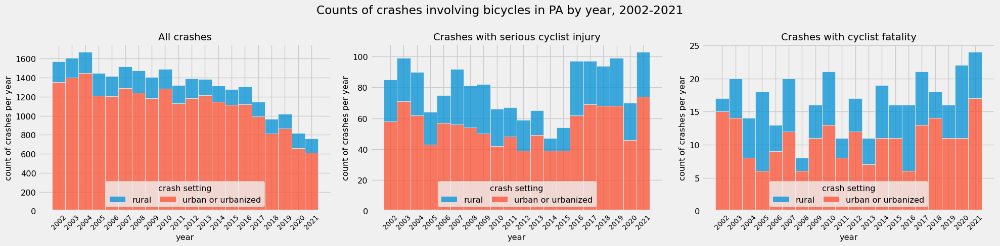

In [7]:
plot_over_time(split_urban_rural=True)

I can see a few things:
* Although rural crashes represent a fairly small percentage of all crashes (between 12-20% annually) they consistently represent a much larger percentage of crashes with serious cyclist injury and of crashes with cyclist fatality.
* There are several years in which the percentage of rural crashes among crashes with cyclist fatality was much larger than usual.  In particular, in 2005 and 2016 the majority of crashes with cyclist fatality were rural, and in 2020 half were rural.

I'll continue to break down crash counts over time between rural and urban/urbanized settings.

<a id="time_month"></a>
#### Crash totals by month of the year

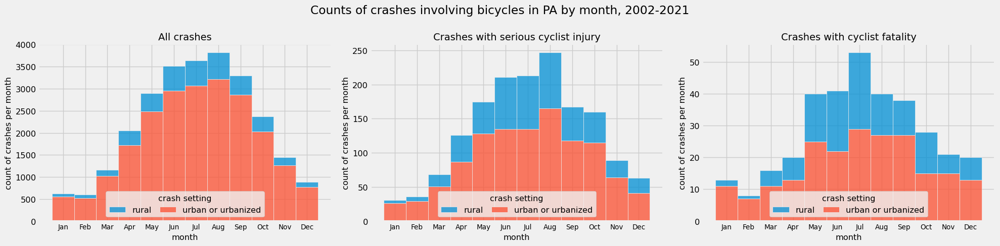

In [8]:
plot_over_time(feature='CRASH_MONTH',label='month',split_urban_rural=True)

In [9]:
perc_change_table(period='month')

month,1,2,3,4,5,6,7,8,9,10,11,12
monthly change of:,,,,,,,,,,,,
all crashes,-29.2%,-4.0%,93.7%,76.0%,41.2%,21.2%,3.5%,5.1%,-13.6%,-28.3%,-39.1%,-38.5%
with serious injury,-50.8%,16.1%,88.9%,85.3%,38.9%,20.6%,0.9%,16.0%,-32.4%,-4.2%,-44.4%,-29.2%
with fatality,-35.0%,-38.5%,100.0%,25.0%,100.0%,2.5%,29.3%,-24.5%,-5.0%,-26.3%,-25.0%,-4.8%
with either,-47.0%,0.0%,90.9%,72.6%,48.3%,16.7%,5.6%,8.3%,-28.6%,-8.3%,-42.0%,-23.9%


The above table should be read carefully.  The category for a particular month contains all samples from that month from every year, and so the percent change entries under '1' should be interpreted as the percent change between the December total (for all years) and the January total (for all years).

For urban/urbanized crashes:
* The total monthly crash count roughly resembles a truncated bell curve centered around August 1.  This is consistent with monthly patterns in bicycle utilization counts and average time spent riding daily per person - see for instance [this chart](https://www.bts.gov/archive/publications/omnistats/volume_02_issue_06/figure1) from the U.S. Bureau of Transportation Statistics.
* The monthly count of crashes with serious cyclist injury follows a similar distribution, except for a suppression in the count in the month of September and an elevation in February.
* The monthly count of crashes with cyclist fatality follows a similar pattern, except for a somewhat elevated counts in January, May, July, December and somewhat suppressed counts in April and October.  These may not be significant effects, since there are only 338 cyclist fatality samples. That sample size is small enough that I should expect a noisy view of the actual distribution.

For rural crashes:
* The percentage of crashes which are rural varies between 12-16% monthly, but is lower in winter and higher in warmer months.  I expect that this is occuring for two reasons:
    * Recreational cycling much more common in warmer months than colder months, whereas commuting by bicycle has a less pronounced seasonal effect.  Cycling is a more common mode of commuting in urban settings than rural settings.
    * Rural roads and their shoulders are more likely to be obstructed by snow and ice for long periods of time in the winter months as compared to urban streets.
* This monthly variation in percentage of crashes which are rural is more pronounced among crashes with serious cyclist injury or fatality.  In particular, almost half of fatal crashes were rural in the months of June and July.

<a id="time_monthly"></a>
### Monthly crash totals over 2002-2021

I'll take a quick look at long-term seasonality by plotting each month's actual counts rather than summing over years.

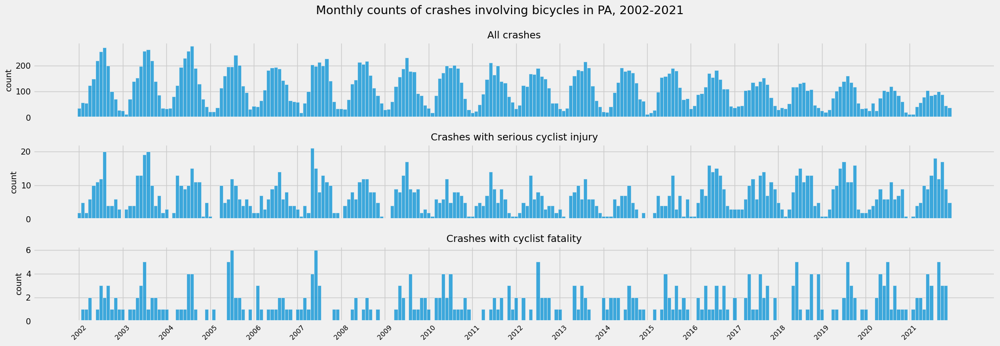

In [10]:
df = crashes.copy()

# Initialize figure and plot cohort monthly counts
fig,axs=plt.subplots(3,1,figsize=(20,7),sharex=True)
fig.suptitle('Monthly counts of crashes involving bicycles in PA, 2002-2021',fontsize='large')
sns.histplot(ax=axs[0],data = df, x='DATE')
sns.histplot(ax=axs[1],data = df[df.BICYCLE_SUSP_SERIOUS_INJ_COUNT>0],x='DATE')
sns.histplot(ax=axs[2],data = df[df.BICYCLE_DEATH_COUNT>0],x='DATE')

# Format axes
for ax in axs:
    ax.yaxis.set_tick_params(labelsize='small')
    ax.set_ylabel(f'count',fontsize='small')
    ax.set_xlabel(None)
axs[2].xaxis.set_tick_params(labelsize='x-small',labelrotation=45,labelleft=True)
axs[2].set_xticks(range(0,240,12),labels=crashes.CRASH_YEAR.unique())
axs[0].set_title('All crashes',fontsize='medium')
axs[1].set_title('Crashes with serious cyclist injury',fontsize='medium')
axs[2].set_title('Crashes with cyclist fatality',fontsize='medium')
plt.tight_layout()
plt.show()

del df

Some additional observations regarding these monthly count plots:
* I see consistent seasonality in the monthly counts of all crashes, with a general downward trend which reflects the trend in annual counts of all crashes that I saw prior.
* Recall that the highest annual counts of crashes with serious cyclist injury were in 2003, 2016-2019, and 2021.  From this monthly plot I can see that the distribution in 2003 was heavily supported with high July-August numbers, whereas the distributions in recent years are broader with more support in spring and fall.
* The noise in the fatality data (due to the small sample size) is quite apparent.  However, I can observe more fatalities than usual in spring and fall of 2020.

<a id="time_day"></a>
#### Occurences by day of the week

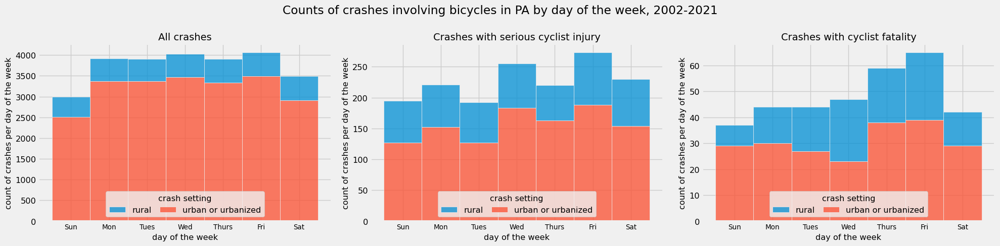

In [11]:
plot_over_time(feature='DAY_OF_WEEK',label='day of the week',split_urban_rural=True)

For urban/urbanized crashes:
* On average, more crashes occur on weekdays than on weekend days, and more crashes on Saturday than Sunday.  The average number of crashes across weekdays is fairly similar.
* The variation in the number of crashes with serious injuries among weekdays reflects the variation in numnber of total crashes, with Friday and Wednesday having the most.
* Significantly more crashes with cyclist fatality occur on Friday and Thursday than on the other weekdays.  Afternoon commuting traffic is known to be heaviest on Thursday and Friday, which may account for the increase in fatalities on these days.

Rural crash variations during the week are quite different:
* There is not much variation in the number of crashes from day to day.  The count is smallest on Sunday and increases throughout the week, but this effect is less pronounced and Saturday actually has the largest count.
* The count of crashes with serious cyclist injury is also fairly stable throughout the week, but the counts on Friday and Saturday are slightly higher.
* The count of fatal crashes varies much more, peaking on Wednesday and Friday.
    

<a id="time_hour"></a>
#### Occurences by hour of the day

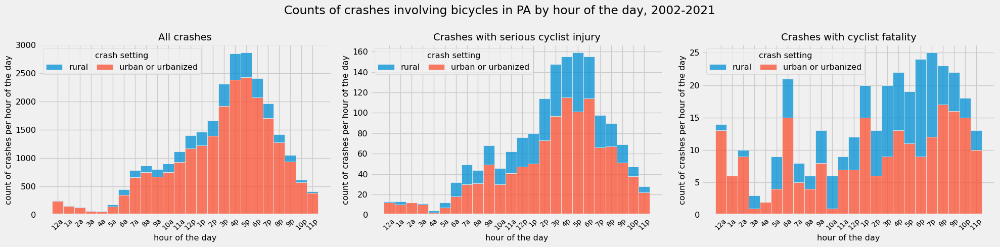

In [12]:
plot_over_time(feature='HOUR_OF_DAY',label='hour of the day',split_urban_rural=True,best_legend=True)

For urban/urbanized crashes:
* Crash counts rise throughout the morning and afternoon, and peak during the afternoon rush hours - in fact, over 53% of crashes occur between 2pm-8pm and  over 21% occur between 4pm-6pm.
* Crashes with serious cyclist injury, and with cyclist fatality, are less densely concentrated near the afternoon rush - a significant portion happen in the morning, and and outsized portion overnight.  In particular, 7% of all crashes happen between 10pm-5pm, but 10% of serious injury crashes and 26% of fatal crashes happen during those same hours.

For rural crashes:
* Crash counts similarly rise throughout the day, but almost none happen at night - 3% of rural crashes happen between 10pm-5pm as compared to 7% of urban/urbanized crashes during that same time frame.  Cycling during the night is much less common in a rural setting, as rural roads are much less well-lit.
* The 6am spike shown in fatal urban/urbanized crashes is non-existent in fatal rural crashes.

Uncomment the following if you want to take a closer look at hourly counts for each day of the week:

In [13]:
# days = ['Sun','Mon','Tues','Wed','Thurs','Fri','Sat']
# for i,day in enumerate(days):
#     plot_over_time(df = crashes[crashes.DAY_OF_WEEK==i+1], feature='HOUR_OF_DAY',label=f'hour of the day ({day})',kind='hist')

<a id="map"></a>
## Visualizing locations of crashes on a map, over time

In [14]:
def plot_map(df=crashes,city=None,animate=True,animate_by='year'):
    """
    Displays a plotly.express.scatter_mapbox interactive map
    of crashes in a municipality if specified, or otherwise
    statewide.  Can be animated over time or static.
    
    Parameters:
    -----------
    df : pd.DataFrame
        dataframe of crash samples
    city : tuple or none
        if provided, must be a tuple (code,name)
        - code : str
            the code corresponding to the desired municipality
            (see the data dictionary)
        - name : str
            the name you want to use for the municipality
            in plot title
    animate : bool
        if animate==True, then the map will animate using
        the frequency provided in animate_by
    animate_by : str
        the desired animation frequency, must be
        either 'year' or 'month'
   
   Returns: None (displays map figure)
   --------
    """
    # Copy df and create new column for color coding event type
    df = df.copy()
    df.loc[df.BICYCLE_SUSP_SERIOUS_INJ_COUNT>0,'Serious cyclist injury or death']='death'
    df.loc[df.BICYCLE_DEATH_COUNT>0,'Serious cyclist injury or death']='serious injury'
    df['Serious cyclist injury or death']=df['Serious cyclist injury or death'].fillna('neither')
    
    # Set animation parameters
    if animate:
        if animate_by == 'year':
            animation_frame = 'CRASH_YEAR'
            title_animate = ' by year'
        elif animate_by == 'month':
            animation_frame = 'DATE'
            title_animate = ' by month'
        else:
            raise ValueError("animate_by must be 'year' or 'month'")
    else:
        animation_frame = None
        title_animate = ''
    
    # Adjustments for when city is provided 
    if city is not None:
        df = df[df.MUNICIPALITY==city[0]]
        # Ignore extreme outlier samples - lat,lon may be incorrect
        df = df[np.abs(stats.zscore(df.DEC_LAT))<=4]
        df = df[np.abs(stats.zscore(df.DEC_LONG))<=4]
        title_place = city[1]+', PA'
    else:
        title_place = 'PA'
    
    # Compute default zoom level based on lat,lon ranges.
    # open-street-map uses 
    max_lat, min_lat = df.DEC_LAT.max(), df.DEC_LAT.min()
    max_lon, min_lon = df.DEC_LONG.max(), df.DEC_LONG.min()
    
    # 2^(zoom) = 360/(longitude width of 1 tile)
    zoom = np.log2(360/max(max_lon-min_lon,max_lat-min_lat))
    
    lat_center = (max_lat+min_lat)/2
    lon_center = (max_lon+min_lon)/2
    
    # Adjust width so that aspect ratio matches shape of state
    width_mult = (max_lon-min_lon)/(max_lat-min_lat)
    
    # Plot mapbox
    fig = px.scatter_mapbox(df, lat='DEC_LAT',lon='DEC_LONG',
                            color='Serious cyclist injury or death',
                            color_discrete_map={'neither':'royalblue','serious injury':'orange','death':'crimson'},
                            mapbox_style='open-street-map',
                            animation_frame = animation_frame,
                            hover_data = {'DEC_LAT':False,'DEC_LONG':False,
                                         'CRASH_YEAR':True,'CRASH_MONTH':True},
                            width = width_mult*500,height=700,zoom=zoom,
                            center={'lat':lat_center,'lon':lon_center},
                            title=f'Crashes involving bicycles{title_animate} in {title_place}, 2002-2021')
    fig.update_layout(legend=dict(orientation='h',xanchor='right',yanchor='bottom',x=1,y=1.02))
    fig.show()

<a id="map_state"></a>
### Statewide crashes by year

The function plot_map plots crash events on a map using DEC_LAT, DEC_LONG data.  I won't do an in-depth analysis, but the visualization helps illustrate how the crash events are distributed throughout the state, and how the geographic distribution varies over time.

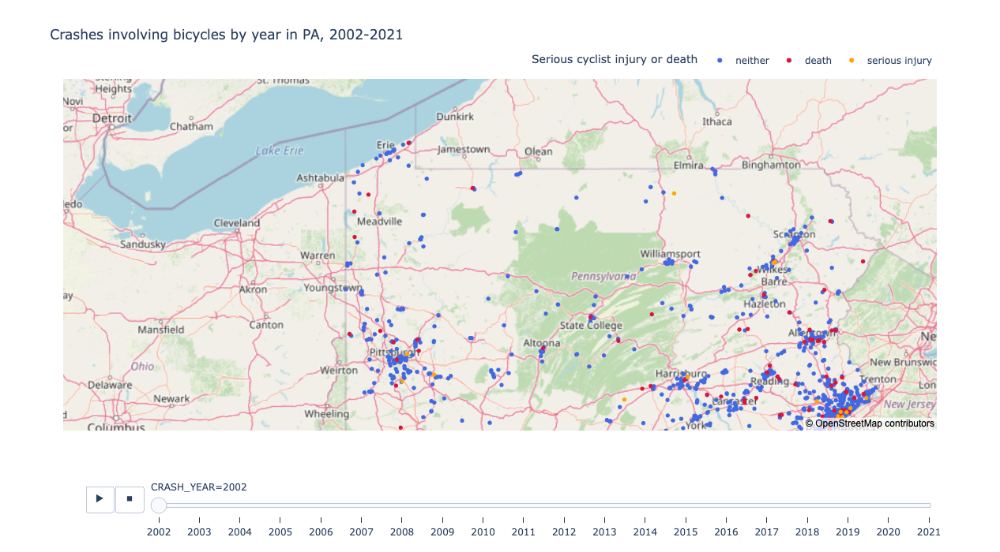

In [15]:
plot_map()

<a id="map_phila"></a>
### Focusing on Philadelphia

The plot_map function can also focus in on a particular municipality by passing in its municipality code and name.  Philadelphia is the largest city and most significant source of crash events.  In the period of 2002-2021:
* 35.5% of PA crashes involving bicycles occured in Philadelphia
* 18.7% of PA crashes involving serious cyclist injury occured in Philadelphia
* 22.2% of PA crashed involving cyclist fatality occured in Philadelphia



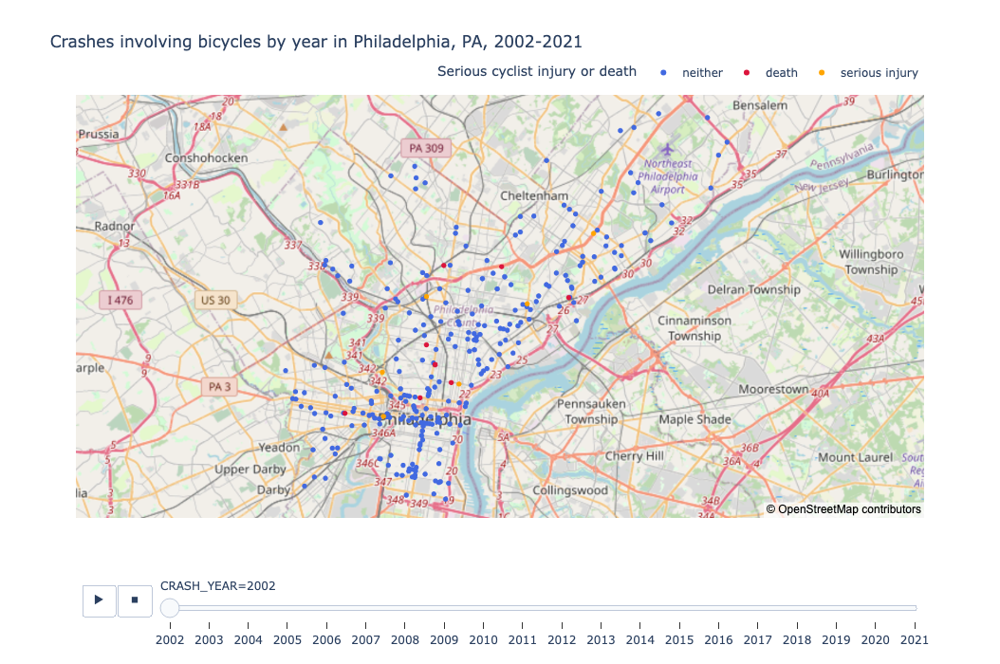

In [16]:
plot_map(city=(67301,'Philadelphia'))

Uncomment and run the following cell to see maps from other major urban areas in PA:

In [17]:
# cities_to_plot = [(67301,'Philadelphia'),
#                   (2301,'Pittsburgh'),
#                   (39301,'Allentown'),
#                   (6301,'Reading'),
#                   (25302,'Erie'),
#                   (35302,'Scranton'),
#                   (22301,'Harrisburg'),
#                   (14410,'State College')
#                  ]
# for city in cities_to_plot:
#     plot_map(city=city)

<a id="features"></a>
### Visualizing prevalence of various feature values

In this section, I shall visualize how the values of features break down over three cohorts:
* all cyclists involved in crashes
* cyclists involved in crashes who were seriously injured
* cyclists involved in crashes who were killed (i.e. suffered fatal injury)

Reminder: the [data dictionary](https://pennshare.maps.arcgis.com/sharing/rest/content/items/fd0412e19feb45419da49eb7a759060d/data) defines "serious injury" and "fatal injury" as:
* serious injury: "incapacitating injury, including bleeding wounds and distorted members (amputations or broken bones), and requires transport of the patient from the scene."
* fatal injury: "the person dies as a result of the injuries sustaines in the crash within 30 days of the crash."

In [18]:
pd.concat([cyclists.INJ_SEVERITY.value_counts()[['susp_serious_injury','killed']],pd.Series({'total':cyclists.shape[0]})],axis=0)

susp_serious_injury     1609
killed                   338
total                  26882
dtype: int64

Note that I will combine the cyclist groups who were seriously injured or killed because the number of samples of cyclists who were kills was very low (338 out of 26882, i.e. 1.25% of samples).  Such a small sample set can be noisy result in less reliable conclusions.  Moreover, I expect that the distinction between serious injury and fatality is heavily influenced by factors that are outside the scope of the dataset such as the underlying health of the cyclist, the quality of medical care they might have received, and the fine details of the collision geometry.

I will focus on several types of features:
* Features related to the cyclist:
    - demographic features: AGE_BINS, SEX
    - cyclist helmet feature: RESTRAINT_HELMET
    - features describing movement and position of the bicycle at the time of the crash: VEH_MOVEMENT, VEH_POSITION
    - features describing the bicycle's involvement in the crash: VEH_ROLE, IMPACT_SIDE,
* Features related to the crash event:
    - chronological features: DAY_OF_WEEK, HOUR_OF_DAY
    - manner of crash: COLLISION_TYPE, 
    - environment/location features: WEATHER, ILLUMINATION,INTERSECT_TYPE, LOCATION_TYPE, RELATION_TO_ROAD, URBAN_RURAL
    - roadway features:  RDWY_ALIGNMENT, GRADE,SPEED_LIMIT, ROAD_CONDITION
    - traffic control device features: TCD_TYPE, TCD_FUNC_CD
* Binary features indicating certain factors in the crash:
    - motor vehicle factors: BUS, SUV, SMALL_TRUCK, HEAVY_TRUCK, VAN, COMM_VEHICLE
    - driver behavior factors: AGGRESSIVE_DRIVING, NHTSA_AGG_DRIVING, CROSS_MEDIAN, LANE_DEPARTURE,
      RUNNING_STOP_SIGN, RUNNING_RED_LT, SPEEDING_RELATED, TAILGATING,
    - driver condition factors: CELL_PHONE, DISTRACTED, DRINKING_DRIVER, DRUGGED_DRIVER, FATIGUE_ASLEEP, IMPAIRED_DRIVER
    - driver demographic factors: MATURE_DRIVER, YOUNG_DRIVER
    
Note that some categories are very rare! I only include in our charts feature categories which are represented in at least 0.5% of some cohort of cyclist samples.

In [20]:
cat_features = ['AGE_BINS', 'SEX','RESTRAINT_HELMET',
                'VEH_MOVEMENT', 'VEH_POSITION','VEH_ROLE',
                'IMPACT_SIDE','URBAN_RURAL',
                'DAY_OF_WEEK','HOUR_OF_DAY','COLLISION_TYPE',
                'RDWY_ALIGNMENT','GRADE','SPEED_LIMIT','ROAD_CONDITION','WEATHER',
                'ILLUMINATION','INTERSECT_TYPE','LOCATION_TYPE', 'RELATION_TO_ROAD',
                'TCD_TYPE', 'TCD_FUNC_CD']
flag_features = ['BUS', 'HEAVY_TRUCK', 'SMALL_TRUCK', 'SUV','COMM_VEHICLE', 
                 'RUNNING_STOP_SIGN','RUNNING_RED_LT','SPEEDING_RELATED', 'TAILGATING',
                 'CROSS_MEDIAN', 'LANE_DEPARTURE','AGGRESSIVE_DRIVING','NHTSA_AGG_DRIVING',
                 'CELL_PHONE','DISTRACTED','DRINKING_DRIVER', 'DRUGGED_DRIVER',
                 'FATIGUE_ASLEEP','IMPAIRED_DRIVER',
                 'MATURE_DRIVER','YOUNG_DRIVER']

In [21]:
def feat_perc(feat, df=cyclists, col_name = 'percentage', feat_name = None):
    """
    Constructs a single-column dataframe 'perc'
    containing the value counts in the series
    df[feat] as percentages of the whole.
    - 'df' is the input dataframe.
    - 'feat' is the desired column of df.
    - 'col_name' is the name of the
    column of the output dataframe
    - 'feat_name' is the index name
    of the output dataframe if provided, otherwise
    will use 'feat' as index name.
    """
    perc = pd.DataFrame({col_name:df[feat].value_counts(normalize=True).sort_index()})
    if feat_name:
        perc.index.name=feat_name
    else:
        perc.index.name=feat
    return perc
    
def feat_perc_comp(feat,df=cyclists,feat_name=None,cohort_name = None,merge_inj_death=True):
    """
    Returnes a styled dataframe (Styler object) 'perc_comp'
    whose underlying dataframe has three columns
    containing value counts of 'feat' among:
    - all cyclists involved in crashes
    - cyclists suffering serious injury or fatality
    each formatted as percentages of the series sum.
    Styled with bars comparing percentages
    Inputs:
    - 'df' is cyclists by default, but can be changed
    e.g. if you want to filter the samples
    - 'feat' if the desired feature to use
    - 'feat_name' is the index name
    of the output dataframe if provided, otherwise
    will use 'feat' as index name.
    - 'cohort_name' is a qualifier in front
    of "cyclists" in titles, if provided
    (e.g. "urban")
    - if merge_inj_death is set to False,
    then cyclists suffering serious injury and
    the cyclists suffering fatality will be separated
    into separate columns (three total columns)
    
    """
    # Need qualifier for titles if restricting cyclist cohort
    qualifier = cohort_name if cohort_name is not None else ''
    
    # Two columns or three, depending on merge_inj_death
    if merge_inj_death:
        perc_comp = feat_perc(feat,df=df,feat_name=feat_name,
                         col_name='all cyclists',)\
                .merge(feat_perc(feat,feat_name=feat_name,
                                 df=df.query('SERIOUS_OR_FATALITY==1'),
                                 col_name=qualifier+'cyclists with serious injury or fatality'),
                      on=feat,how='left')
        perc_comp = perc_comp[perc_comp.max(axis=1)>=0.005]
    else:
        perc_comp = feat_perc(feat,df=df,feat_name=feat_name,
                         col_name='all cyclists')\
                .merge(feat_perc(feat,feat_name=feat_name,
                                 df=df.query('INJ_SEVERITY=="susp_serious_injury"'),
                                 col_name=qualifier+'cyclists with serious injury'),
                      on=feat,how='left')\
                .merge(feat_perc(feat,feat_name=feat_name,
                                 df=df.query('INJ_SEVERITY=="killed"'),
                                 col_name=qualifier+'cyclists with fatality'),
                      on=feat,how='left')
    
    # If feature is not ordinal, sort rows descending by crash counts
    if feat not in ['AGE_BINS','SPEED_LIMIT','DAY_OF_WEEK','HOUR_OF_DAY']:
        perc_comp=perc_comp.sort_values(by='all cyclists',ascending=False)
    
    # Relabel day numbers with strings
    if feat == 'DAY_OF_WEEK':
        perc_comp.index=['Sun','Mon','Tues','Wed','Thurs','Fri','Sat']
        perc_comp.index.name='DAY_OF_WEEK'
    perc_comp=perc_comp.fillna(0)
    table_columns = list(perc_comp.columns)
    
    # Define format for displaying floats
    format_dict={col:'{:.2%}' for col in perc_comp.columns}

        
    # Define table styles
    styles = [dict(selector="caption",
                   props=[("text-align", "center"),
                          ("font-size", "100%"),
                          ("color", 'black'),
                          ("text-decoration","underline"),
                          ("font-weight","bold")])]
    
    # Return formatted dataframe
    if feat_name is None:
        feat_name=feat
    caption = f'Breakdown of {feat_name} among cyclist groups'
    return perc_comp.reset_index().style.set_table_attributes("style='display:inline'")\
                                    .format(format_dict).bar(color='powderblue',
                                    subset=table_columns).hide_index().set_caption(caption)\
                                    .set_table_styles(styles)

<a id="features_vis"></a>
#### Feature breakdown visualization

In [22]:
# Define scheme for HTML output of dataframes, can have multiple per line
output=''
tables = [feat_perc_comp(feat) for feat in cat_features]
tables = [(x,x.data.shape[0]) for x in tables]
tables = sorted(tables,key=lambda x:x[1],reverse=True)
tables = [table[0] for table in tables]
tables = tables+[feat_perc_comp(feat) for feat in flag_features]
for table in tables:
    output += table._repr_html_()
    output += "\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0"
display_html(output,raw=True)

HOUR_OF_DAY,all cyclists,cyclists with serious injury or fatality
0.000000,0.97%,1.39%
1.000000,0.63%,0.98%
2.000000,0.52%,1.13%
3.000000,0.28%,0.72%
5.000000,0.70%,1.13%
6.000000,1.67%,2.72%
7.000000,2.99%,3.08%
8.000000,3.29%,2.57%
9.000000,3.02%,4.21%
10.000000,3.44%,2.77%


<a id="features_summary"></a>
#### Summary of feature value comparison

<table>
    <tr>
        <th> aspect of crash </th>
        <th> observations based on all cyclists</th>
        <th> any changes observed when restricting to those with serious injury or fatality</th>
    </tr>
    <tr>
        <td><b>cyclist age</b></td>
        <td>10-20 is the most common range, followed by 20-30.</td>
        <td>Percentage of older cyclists becomes more prevalent - over 50, dramatically so</td>
    </tr>
    <tr>
        <td><b>cyclist helmet use</b></td>
        <td>The majority were recorded as not wearing a helmet, and over 2000 cyclists had 'unknown' helmet status.</td>
        <td>The prevalence of helmets decreases slightly.</td>
    </tr>
    <tr>
        <td><b>cyclist position, movement, road grade</b></td>
        <td><ul>
            <li>The vast majority were moving straight at the time of the collision.  Aside from turning left, other movement categories are rare.</li>
            <li>The most common position is in the right lane at the curb, but other positions are not uncommon.</li>
            <li>The vast majority were traveling on level grade, but downhill collisions were not uncommon.</li>
        </ul>
            </td>
        <td><ul>
            <li>The percentage of moving straight decreases, and other categories increase: turning left, changing or merging, and navigating a curve.</li>
            <li>The percentage in the right lane near the curb increases - this situation is the most prevalent position but perhaps more dangerous for cyclists.</li>
            <li>The percentage on level road decreases and percentage of all categories involving hills increases.</li>
        </ul></td>
    </tr>
    <tr>
        <td><b>collision time and day</b></td>
        <td><ul>
            <li>The incidence of cyclists collisions increased steadily throughout the day, peaking between 4-5pm.</li>
            <li>Overall, the vast majority of cyclists were involved in collisions during the daylight hours (when the vast majority of cycling occurs).</li>
            <li>More cyclists were involved in collisions on weekdays, than weekends, which is consistent with my expectation that weekday commuting traffic would increase the incidence of collisions overall.</li>
        </ul></td>
        <td><ul>
            <li>The percentages for all hours from 10pm-6am increase to varying degrees, and the percentages for daylight hours almost all decrease.</li>
            <li>The percentage for Friday increase and the percentages for Monday and Tuesday decrease.  One might speculate that drivers lose patience towards the end of the workweek.</li>
        </ul> 
        </td>
    </tr>
    <tr>
    <tr>
        <td><b>collision type and cyclist impact point</b></td>
        <td><ul>
            <li>Front impact points are most common.</li>
            <li>Left, right, and rear impacts are not uncommon.</li>
            <li>The vast majority of collisons are angle collisions.</li>
            <li>The majority of cyclists were struck in the collision (as opposed to striking).</li>
        </ul></td>
        <td><ul>
            <li>Front impact points become less prevalent and left and rear become more prevalent.</li>
            <li>Angle and sideswipe collisions become less prevalent and rear end and head on collisions more prevalent.</li>
            <li>The cyclist being struck becomes a little more prevalent, and the percentage for striking and struck doubles.</li>
        </ul> 
        </td>
    </tr>
    <tr>
        <td><b>urban, rural, or urbanized setting</b></td>
        <td>The vast majority of cyclists were in a crash in an urban setting - consistent with my expectation that cycling happens in urban settings.</td>
        <td>The percentage in a rural setting more than doubles, and percentage in urban setting decreases - crashes in rural settings are more dangerous for cyclists.</td>
    </tr>
    <tr>
        <td><b>speed limit where collision occured</b></td>
        <td>The vast majority of cyclists were traveling in a 25mph zone, a very common speed limit in urban settings.</td>
        <td>The percentage traveling in higher speed limit zones increases.</td>
    </tr>
    <tr>
        <td><b>illumination and weather-related conditions</b></td>
        <td><ul>
            <li>The vast majority in daylight collisions - consistent with my expectation that cycling happens in daylight.</li>
            <li>The vast majority in clear weather, and rain was the only other significant category at 6%.</li>
            <li>The vast majority involved a dry road surface, and 8% a wet road surface.</li>
        </ul></td>
        <td>The percentage traveling in daylight decreases, percentage traveling in dark unlit conditions triples, and percentage traveling at dawn doubles.</td>
    </tr>
    <tr>
        <td><b>crash location</b></td>
        <td><ul>
            <li>The majority were in collisions in intersections (with 4-way the most common type), and 35% in midblock collisions.</li>
            <li>About half were in collisions where traffic control devices are not relevant, and the other half roughly split between stop signs and traffic signals.</li>
            <li>When present and controlled, traffic control devices were almost always functioning properly.</li>
            <li>The roadway was straight in the vast majority of cases - only 3% of cyclists were in a collision on a curve.  Though it's important to remember that collisions in intersections still are classifed as 'straight' if the roadway on which the cyclist is currently traveling is not curving in the area of the intersection.</li>
        </ul></td>
        <td><ul>
            <li>The percentage in midblock collisions increases to 46%, which is consistent with my expectation that midblock areas are more dangerous for cyclist due to higher motorist speeds.</li>
            <li>The percentage in areas where traffic control devices not applicable increases significantly, which is consistent with the increased prevalence of midblock collisions since these devices tend to be at intersections</li>
            <li>The percentage in areas with uncontrolled traffic control devices (e.g. stop signs) increases, which is consistent with my exectation that intersections with stop signs are more dangerous for cyclists than intersections with traffic signals.</li>
            <li>The percentage of cyclists in collisions along a curved roadway more than doubled.</li>
        </ul>
        </td>
    </tr>
    <tr>
        <td><b>vehicle flags</b></td>
        <td><ul>
            <li>Few cyclists were in collisions involving heavy trucks, buses, or commercial vehicles (1-2% for each).</li>
            <li>Few cyclists were in collisions involving drinking drivers </li>
        </ul></td>
        <td>The percentages for buses, small trucks, and SUVs increase significantly.  The percentage for heavy trucks triples, and the percentage for commmercial vehicles doubles.</td>
    </tr>
    <tr>
        <td><b>driver condition or behavior flags</b></td>
        <td><ul>
            <li>Very few cyclists were involved in collisions which were speeding-related or in which a vehicle ran a stop sign, ran a red light, was tailgating, crossed the median, or made a lane departure (less than 3% for each).</li>
            <li>Very few cyclists were involved in collisions with drinking drivers or drugged drivers (less than 2% for each).</li>
            <li>While very few cyclists were involved in collisions with drivers flagged as using cell phones or fatigued or asleep, 5% were involved in collisions with distracted drivers.</li>
            <li>Around 22% of cyclists were involved in collisions with drivers exhibiting at least one aggressive driving behavior, but only 1% with drivers exhibiting at least two different aggressive driving behaviors (i.e. NHTSA-qualified aggressive driving).</li>
        </ul></td>
        <td><ul>
            <li>The percentage of cyclists in collisions with at least one NHTSA-qualifying aggressive driver increases.</li>
            <li>The percentage for drinking drivers more than triples, and the percentage for drugged drivers increases five-fold.</li>
            <li>The percentage in speeding-related collisions triples.</li>
            <li>The percentage for distracted drivers increases.</li>
            <li>The percentage in collisions in which a vehicle made a lane departure or crossed the median doubles.</li>
        </ul>
        </td>
    </tr>
</table>

<a id="pairs"></a>
### Visualizing how pairing factors affects chance of serious injury or fatality

Approximately 7.4% of cyclists in the dataset suffered serious injury or fatality.  In the previous section, I identified some particular factors which seem to especially strongly affect the percentage of cyclists suffering serious injury or fatality:

* Cyclist aged over 50 years old
* Cyclist traveling on a curved road or on a hilly grade
* Collision being rear-end type
* Cyclist being both striking and struck
* Collision occuring midblock
* Collision in a rural setting
* Collision in dark unlit conditions or at dawn
* Collision occuring on a Friday
* Collision being speeding-related
* Involvement of a truck, SUV, or commercial vehicle
* Involvement of a drugged driver, drinking driving, or distracted driver
* Involvement of NHTSA-qualifying aggressive driver
* Involvement of a young driver (under 20yo) or a mature driver (over 65yo)

In [23]:
cyclists['OVER_50'] = (cyclists.AGE>=50).astype('int')

filters = {'cyclist over 50':cyclists.OVER_50==1,
           'striking and struck':cyclists.VEH_ROLE=='striking_struck',
           'rear-end':cyclists.COLLISION_TYPE=='rear_end',
           'rear impact':cyclists.IMPACT_SIDE=='rear',
           'curved road':cyclists.RDWY_ALIGNMENT=='curve',
           'hill':~cyclists.GRADE.isin(['level','unknown']),
           'midblock':cyclists.INTERSECT_TYPE=='midblock',
           'rural':cyclists.URBAN_RURAL=='rural',
           'dark unlit':cyclists.ILLUMINATION=='dark_unlit',
           'dawn':cyclists.ILLUMINATION=='dawn',
           'Friday':cyclists.DAY_OF_WEEK==6,
           'speeding related':cyclists.SPEEDING_RELATED==1,
           'heavy truck':cyclists.HEAVY_TRUCK==1,
           'small truck':cyclists.SMALL_TRUCK==1,
           'SUV':cyclists.SUV==1,
           'commercial vehicle':cyclists.COMM_VEHICLE==1,
           'drugged driver':cyclists.DRUGGED_DRIVER==1,
           'drinking driver':cyclists.DRINKING_DRIVER==1,
           'distracted driver':cyclists.DISTRACTED==1,
           'NHTSA agg driver':cyclists.NHTSA_AGG_DRIVING==1,
           'driver under 20':cyclists.YOUNG_DRIVER==1,
           'driver over 65':cyclists.MATURE_DRIVER==1}

In [24]:
percents = [cyclists[filters[filter]].SERIOUS_OR_FATALITY.sum(axis=0)/cyclists[filters[filter]].shape[0] for filter in filters]
percents = pd.DataFrame({'crash factor':filters.keys(),
              'serious injury or fatality percentage':percents}).set_index('crash factor')\
            .sort_values(by='serious injury or fatality percentage',ascending=False).transpose()
format_dict={col:'{:.2%}' for col in percents.columns}
percents.style.format(format_dict).background_gradient(axis=None,cmap='bwr',gmap=percents,vmin=.074-0.5,vmax=.074+0.5)

crash factor,drugged driver,drinking driver,heavy truck,speeding related,dark unlit,dawn,commercial vehicle,curved road,rural,striking and struck,rear-end,NHTSA agg driver,hill,rear impact,cyclist over 50,small truck,midblock,driver under 20,distracted driver,SUV,driver over 65,Friday
serious injury or fatality percentage,35.38%,26.74%,22.36%,21.29%,20.91%,19.50%,17.49%,16.34%,15.86%,14.52%,13.64%,12.84%,12.43%,12.20%,11.73%,10.56%,9.61%,9.31%,8.78%,8.68%,8.63%,8.21%


Note that all of these factors, increase the probability that a cyclist will suffer a servere injury or fatality - with some having a very dramatic effect.   When pairing these factors, I expect the effect to compound - e.g. I expect that a collision that is speeding-related involving a drinking driver will lead to higher chance of serious injury or death than either factor alone provides.

The following table gives, for each pairing of factors from the above list, the percentage of cyclists suffering serious injury or fatality having been involved in a crash with BOTH of those factors.  The diagonal entries are just the percentages from the above table, i.e. the percentages corresponding to single factors.  Percentages are omitted for pairs for which there are fewer than 27 samples (i.e. correspond to less than 0.1% of the entire dataset).  Lowering this threshold will reveal more percentages, but observations I glean from very small sample sets are probably not reasonable conclusions about the data distribution from which the dataset is taken.

In [25]:
def gray_empty(val):
    """
    Function for styling a pd.DataFrame,
    where a cell will be given a gray background
    if it contains '' otherwise no background color
    
    Parameters:
    -----------
    val : any
        the entry of a cell in the dataframe
    Returns:
    --------
    'background-color: %s' % color : str
        a CSS style tag, where color is 'gray' if val == '',
        else color is ''
    """
    color = 'gray' if val=='' else ''
    return 'background-color: %s' % color

def highlight_diag(df):
    """
    Function for styling a pd.DataFrame,
    where a cell will be given a gold background
    if it lies on the main diagonal, otherwise
    no background color
    
    Parameters:
    -----------
    df : pd.DataFrame
        the given dataframe
    
    Returns:
    --------
    diag_mask : pd.DataFrame
        a dataframe with the same shape, indices, and columns as df
        which contains CSS style tags as its entries.  entries on
        the main diagonal are 'background-color: gold' and others are ''
    """
    diag_mask = pd.DataFrame("", index=df.index, columns=df.columns)
    min_axis = min(diag_mask.shape)
    diag_mask.iloc[range(min_axis), range(min_axis)] = 'background-color: gold'
    return diag_mask

In [26]:
def crosstab_percent(filters,df = cyclists,target='SERIOUS_OR_FATALITY',thresh=0.001):
    """
    Generates two dataframes based on the count of samples with target==1
    for each pair of filters in a list provided.
    
    Parameters:
    ----------
    df : pd.DataFrame
        the input dataframe
    filters : dict
        key:value pairs are filter_name:filter where
            - filter : pd.DataFrame
                a mask for df, i.e. a dataframe with the same
                shape, indices, and columns of df whose entries
                are bools.
            - filter_name : str
                the name of the filter, to be used in titles
    target : str
        the name of the target feature
    thresh : float
        the desired cutoff threshold for displaying values
    
    Returns:
    --------
    crosstabs : pd.DataFrame
        A symmetric dataframe:
            - indices correspond to filters (names from filter_name)
            - columns correspond to filters (names from filter_name)
            - each entry is the count of samples in df which pass both filters
              corresponding to that entry's row and column, as a string
    
    percents : pd.DataFrame
        A symmetric dataframe:
            - indices correspond to filters (titles from filter_name)
            - columns correspond to filters (titles from filter_name)
            - each entry is the percent of samples which have target==1,
              among those samples in df which pass both filters
              corresponding to that entry's row and column,
              rounded to one decimal place, as a string

    Note that if an entry in crosstabs is smaller than
    thresh*(number of samples in df), then the corresponding entry
    of crosstabs and percents is replaced with the
    empty string.
    """
    # Count of seriously injured or killed per filter pair
    crosstabs = np.array([[df[(filters[f1])&(filters[f2])].shape[0]\
                        for f1 in filters]\
                       for f2 in filters ])
    crosstabs = pd.DataFrame(crosstabs,index=filters.keys(),columns=filters.keys())
    
    # Percent seriouslty injured or killed per filter pair
    percents = np.array([[round(100*df[(filters[f1])&(filters[f2])]\
                                [target].sum()/df[(filters[f1])&(filters[f2])].shape[0],2)\
                        for f1 in filters]\
                       for f2 in filters ])
    percents = pd.DataFrame(percents,index=filters.keys(),columns=filters.keys())
    
    # Return dataframes with string type entries
    percents = percents[crosstabs>=thresh*df.shape[0]].replace(np.nan,'').astype('str')
    crosstabs = crosstabs[crosstabs>=thresh*df.shape[0]].replace(np.nan,'').astype('str')
    return crosstabs, percents

In [27]:
def stylize_dataframe(df):
    """
    Displays a stylized version of the dataframe df:
    - Cells containing '' np.nan are colored gray
    - Cells containing neither '' nor np.nan which lie
      on the main diagonal are colored yellow
    - Cells containing neither '' nor np.nan which lie
      off of the main diagonal use a gradient color map:
        - Cell (i,j) is colored red if its entry is greater than
          the entry in cell (j,j), with shade indicating difference
        - Cell (i,j) is colored blue if its entry is less than
          the entry in cell (j,j), with shade indicating difference
          
    Parameters:
    -----------
    df : pd.DataFrame
        input dataframe whose entries are either np.nan, '',
        or strings which can be interpreted as floats
    
    Returns: None (displays stylized dataframe)
    --------
    """
    # change strings to float and np.nan before defining gradient map
    df=df.replace('',np.nan).astype('float')
    gmap = pd.DataFrame(0,index=df.index,columns=df.columns)
    for col in df.columns:
        gmap[col] = df[col]-df.loc[col,col]
        gmap[col] = gmap[col].where(gmap[col]>=0,5*gmap[col])
    # display styled dataframe
    display((df.astype('str')+'%').replace('nan%','').style\
            .background_gradient(axis=None, gmap=gmap, cmap='bwr',vmin=-gmap.max().max())\
            .apply(highlight_diag,axis=None).applymap(gray_empty))

In the following table:
* A cell is greyed out if that pair of factors corresponds to fewer than 0.1% of samples (i.e. fewer than 27 samples in our case)
* A diagonal cell contains the percentage of cyclists suffering serious injury or fatality among those involved in crashes exhibiting that one factor (yellow cells)
* An off-diagonal cell corresponds to the percentage of cyclists suffering serious injury or fatality among those involved in crashes exhibiting that pair of factors (red or blue cells):
    * A cell is some shade of red if its percentage is larger than the corresponding yellow percentage in its same **column**, i.e. if its corresponding pair of factors give a higher probability of serious injury or fatality than the single factor corresponding to its **column**; the shade indicates the degree of change in probability
    * A cell is some shade of blue if its percentage is smaller than the corresponding yellow percentage in its same **column**, i.e. if its corresponding pair of factors give a lower probability of serious injury or fatality than the single factor corresponding to its **column**; the shade indicates the degree of change in probability

In [28]:
_, percents = crosstab_percent(filters)
stylize_dataframe(percents)

,cyclist over 50,striking and struck,rear-end,rear impact,curved road,hill,midblock,rural,dark unlit,dawn,Friday,speeding related,heavy truck,small truck,SUV,commercial vehicle,drugged driver,drinking driver,distracted driver,NHTSA agg driver,driver under 20,driver over 65
cyclist over 50,11.73%,26.67%,20.22%,23.48%,24.54%,21.7%,15.69%,19.7%,23.85%,42.11%,13.03%,37.31%,27.45%,16.2%,13.29%,17.39%,,28.3%,15.53%,19.44%,13.0%,14.78%
striking and struck,26.67%,14.52%,28.12%,25.0%,,23.29%,14.13%,27.87%,,,25.42%,,,13.64%,15.52%,,,,17.24%,,,18.42%
rear-end,20.22%,28.12%,13.64%,18.47%,31.75%,24.07%,17.46%,27.46%,37.34%,,16.91%,27.47%,,17.2%,19.43%,23.81%,46.67%,38.57%,18.39%,,17.17%,22.02%
rear impact,23.48%,25.0%,18.47%,12.2%,21.9%,20.67%,19.16%,23.62%,31.51%,,13.3%,30.16%,30.0%,18.14%,16.46%,20.93%,56.41%,45.78%,21.14%,28.57%,15.79%,16.0%
curved road,24.54%,,31.75%,21.9%,16.34%,22.87%,20.3%,22.34%,42.5%,,18.0%,44.44%,,22.12%,21.67%,,,42.86%,19.05%,,29.73%,13.68%
hill,21.7%,23.29%,24.07%,20.67%,22.87%,12.43%,16.13%,21.95%,26.52%,25.93%,15.18%,31.96%,33.33%,18.44%,14.05%,30.43%,70.37%,40.28%,15.16%,19.67%,14.96%,12.75%
midblock,15.69%,14.13%,17.46%,19.16%,20.3%,16.13%,9.61%,18.01%,27.39%,48.98%,10.68%,27.62%,24.46%,12.94%,11.52%,19.61%,50.77%,33.7%,13.21%,16.67%,12.2%,11.84%
rural,19.7%,27.87%,27.46%,23.62%,22.34%,21.95%,18.01%,15.86%,27.6%,33.33%,19.44%,39.85%,28.42%,17.99%,16.95%,25.45%,60.0%,31.52%,17.0%,23.53%,20.27%,15.18%
dark unlit,23.85%,,37.34%,31.51%,42.5%,26.52%,27.39%,27.6%,20.91%,,21.14%,50.0%,,21.51%,23.48%,,,35.85%,16.07%,,24.36%,22.89%
dawn,42.11%,,,,,25.93%,48.98%,33.33%,,19.5%,20.0%,,,,16.67%,,,,,,,


Many of these pairs have small sample sizes.  I focus on a subset of this list:

In [29]:
few_filters = {'cyclist over 50':cyclists.OVER_50==1,
               'rear-end':cyclists.COLLISION_TYPE=='rear_end',
               'curved road':cyclists.RDWY_ALIGNMENT=='curve',
               'hill':~cyclists.GRADE.isin(['level','unknown']),
               'midblock':cyclists.INTERSECT_TYPE=='midblock',
               'rural':cyclists.URBAN_RURAL=='rural',
               'dark unlit':cyclists.ILLUMINATION=='dark_unlit',
               'speeding related':cyclists.SPEEDING_RELATED==1,
               'SUV':cyclists.SUV==1,
               'drinking driver':cyclists.DRINKING_DRIVER==1,
              }


# few_filters = {'
#                 'drinking driver':cyclists.DRINKING_DRIVER==1,
#                'speeding related':cyclists.SPEEDING_RELATED==1,
#                'dark unlit':cyclists.ILLUMINATION=='dark_unlit',
#                'rural':cyclists.URBAN_RURAL=='rural',
#                'curved road':cyclists.RDWY_ALIGNMENT=='curve',
#                'midblock':cyclists.MIDBLOCK==1,
#                'SUV':cyclists.SUV==1}
_,percents = crosstab_percent(few_filters)
stylize_dataframe(percents)

,cyclist over 50,rear-end,curved road,hill,midblock,rural,dark unlit,speeding related,SUV,drinking driver
cyclist over 50,11.73%,20.22%,24.54%,21.7%,15.69%,19.7%,23.85%,37.31%,13.29%,28.3%
rear-end,20.22%,13.64%,31.75%,24.07%,17.46%,27.46%,37.34%,27.47%,19.43%,38.57%
curved road,24.54%,31.75%,16.34%,22.87%,20.3%,22.34%,42.5%,44.44%,21.67%,42.86%
hill,21.7%,24.07%,22.87%,12.43%,16.13%,21.95%,26.52%,31.96%,14.05%,40.28%
midblock,15.69%,17.46%,20.3%,16.13%,9.61%,18.01%,27.39%,27.62%,11.52%,33.7%
rural,19.7%,27.46%,22.34%,21.95%,18.01%,15.86%,27.6%,39.85%,16.95%,31.52%
dark unlit,23.85%,37.34%,42.5%,26.52%,27.39%,27.6%,20.91%,50.0%,23.48%,35.85%
speeding related,37.31%,27.47%,44.44%,31.96%,27.62%,39.85%,50.0%,21.29%,28.3%,51.43%
SUV,13.29%,19.43%,21.67%,14.05%,11.52%,16.95%,23.48%,28.3%,8.68%,42.59%
drinking driver,28.3%,38.57%,42.86%,40.28%,33.7%,31.52%,35.85%,51.43%,42.59%,26.74%


Notice that for this smaller sublist of crash factors, almost all pairs provide a higher probability of cyclist suffering serious injury or fatality than either individual factor in the pair - and many provide a much higher probability.  For some factors, the effect is very dramatic - e.g. drinking driver, speeding related, SUV, and dark unlit compound one another quite a bit.

In [30]:
# few_filters = {
#                'rear-end':cyclists.COLLISION_TYPE=='rear_end',
#                'curved road':cyclists.RDWY_ALIGNMENT=='curve',
#                'rural':cyclists.URBAN_RURAL=='rural',
#                'dark unlit':cyclists.ILLUMINATION=='dark_unlit',
#                'speeding related':cyclists.SPEEDING_RELATED==1,
#                'SUV':cyclists.SUV==1,
#                'drinking driver':cyclists.DRINKING_DRIVER==1,
#               }
few_filters = {
               'curved road':cyclists.RDWY_ALIGNMENT=='curve',
               'dark unlit':cyclists.ILLUMINATION=='dark_unlit',
               'speeding related':cyclists.SPEEDING_RELATED==1,
               'drinking driver':cyclists.DRINKING_DRIVER==1,
              }
_,percents = crosstab_percent(few_filters)
stylize_dataframe(percents)

,curved road,dark unlit,speeding related,drinking driver
curved road,16.34%,42.5%,44.44%,42.86%
dark unlit,42.5%,20.91%,50.0%,35.85%
speeding related,44.44%,50.0%,21.29%,51.43%
drinking driver,42.86%,35.85%,51.43%,26.74%


<a id="summary"></a>
### Summarization of findings

1. The annual counts of crashes involving cyclists in PA showed a consistent downward trend since 2004, decreasing from above 1600 incidents to below 800 incidents in 2021.  However, the annual counts or crashes involving serious cyclist injury or fatality have not declined significantly.  In fact, in 2021 there were 103 crashes involving serious cyclist injury and 24 involving cyclist death - both the highest annual counts in this 20-year dataset!
2. Regarding the distributions of certain crash features and their relationship with cyclist injury severity:
    * The majority of cyclists in collisions are between 10-30 years of age.  However, older cyclists are overrepresented among cyclists suffering serious injury or fatality.
    * Around 75% of cyclists in collisions are traveling in a 25mph or below zone, presumably due to the prevalence of low speed limits in urban settings.  However, almost half of cyclists suffering serious injury or fatality were traveling in higher speed limit zones.
    * Midblock collisions were overrepresented among cyclists who suffered serious injury or fatality, possibly due to the higher vehicle speeds seen at midblock - 46% of cyclists suffering serious injury or fatality were in midblock collisions, as opposed to 35% of all cyclists.
    * 7.4% of cyclists involved in crashes suffered serious injury or fatality.  There are certain crash factors such that when conditioned upon, the percentage of cyclists with serious injury or fatality more than doubles (corresponding percentages in parentheses):
        * Involvement of at least one drugged driver (35.4%) or drinking driver (26.7%) 
        * Involvement of at least one heavy truck (22.4%) or commercial vehicle (17.5%)
        * The crash being speeding-related (21.3%)
        * The crash occuring in a dark unlit setting (20.9%) or at dawn (20%)
        * The crash occuring on a curved roadway (16.3%)
        * The crash occuring in a rural setting (15.9%)
    * When conditioned upon some pairs of these factors, the percentage of cyclists suffering serious injury or fatality surpassed 40%:
        * Speeding-related crashes with a drinking driver involved (51.43%)
        * Speeding-related crashes in dark unlit conditions (50%)
        * Speeding-related crashes on a curved roadway (44.4%)
        * Crashes involving a drinking driver on a curved roadway (42.9%)
        * Crashes on a curved roadway in dark unlit conditions (42.5%)